# **Car Accident Data**
The dataset provides detailed records of road accidents that occurred during January 2021. It includes information such as the accident date, day of the week, junction control, accident severity, geographical coordinates, lighting and weather conditions, vehicle details, and more. The data is valuable for analyzing and understanding the factors contributing to road accidents in this urban area, aiding in the development of strategies for improved road safety.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import numpy as np
import pandas as pd
import os

filepath = '/content/gdrive/MyDrive/למידה חישובית/Road Accident Data.csv'
data = pd.read_csv(filepath)
print(data.shape)
data.head()

(307973, 21)


,Accident_Index,Accident Date,Day_of_Week,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,Local_Authority_(District),Carriageway_Hazards,...,Number_of_Casualties,Number_of_Vehicles,Police_Force,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,200901BS70001,1/1/2021,Thursday,Give way or uncontrolled,T or staggered junction,Serious,51.512273,Daylight,Kensington and Chelsea,NaN,...,1,2,Metropolitan Police,Dry,One way street,30,15:11,Urban,Fine no high winds,Car
1,200901BS70002,1/5/2021,Monday,Give way or uncontrolled,Crossroads,Serious,51.514399,Daylight,Kensington and Chelsea,NaN,...,11,2,Metropolitan Police,Wet or damp,Single carriageway,30,10:59,Urban,Fine no high winds,Taxi/Private hire car
2,200901BS70003,1/4/2021,Sunday,Give way or uncontrolled,T or staggered junction,Slight,51.486668,Daylight,Kensington and Chelsea,NaN,...,1,2,Metropolitan Police,Dry,Single carriageway,30,14:19,Urban,Fine no high winds,Taxi/Private hire car
3,200901BS70004,1/5/2021,Monday,Auto traffic signal,T or staggered junction,Serious,51.507804,Daylight,Kensington and Chelsea,NaN,...,1,2,Metropolitan Police,Frost or ice,Single carriageway,30,8:10,Urban,Other,Motorcycle over 500cc
4,200901BS70005,1/6/2021,Tuesday,Auto traffic signal,Crossroads,Serious,51.482076,Darkness - lights lit,Kensington and Chelsea,NaN,...,1,2,Metropolitan Police,Dry,Single carriageway,30,17:25,Urban,Fine no high winds,Car


In [3]:
#The number of each Accident_Severity- the target
print(data["Accident_Severity"].value_counts())

Accident_Severity
Slight     263280
Serious     40740
Fatal        3904
Fetal          49
Name: count, dtype: int64


# Explanation:

**Accident_Index:** A unique identifier for each accident record.

**Accident Date:** The date on which the accident occurred (format: DD/MM/YYYY).

**Day_of_Week:** The day of the week when the accident took place.

**Junction_Control:** Describes the type of junction control at the accident location (e.g., "Give way or uncontrolled").

**Junction_Detail:** Provides additional details about the junction where the accident occurred (e.g., "T or staggered junction").

**Accident_Severity:** Indicates the severity of the accident (e.g., "Serious").

**Latitude:** The geographic latitude of the accident location.

**Light_Conditions:** Describes the lighting conditions at the time of the accident (e.g., "Daylight").

**Local_Authority_(District):** The local authority district where the accident occurred.

**Carriageway_Hazards:** Describes any hazards present on the carriageway at the time of the accident (e.g., "None").

**Longitude:** The geographic longitude of the accident location.

**Number_of_Casualties:** The total number of casualties involved in the accident.

**Number_of_Vehicles:** The total number of vehicles involved in the accident.

**Police_Force:** The police force that handled the accident.

**Road_Surface_Conditions:** Describes the surface conditions of the road at the time of the accident (e.g., "Dry").

**Road_Type:** Specifies the type of road where the accident occurred (e.g., "One way street").

**Speed_limit:** The speed limit applicable to the road where the accident occurred.

**Time:** The time of day when the accident happened (format: HH:MM).

**Urban_or_Rural_Area:** Indicates whether the accident occurred in an urban or rural area.

**Weather_Conditions:** Describes the weather conditions at the time of the accident (e.g., "Fine no high winds").

**Vehicle_Type:** Specifies the type of vehicle involved in the accident (e.g., "Car," "Taxi/Private hire car").

## Cleaning the dataset

*Remove unnecessary columns


In [3]:
data.drop(['Accident_Index', 'Police_Force', 'Accident Date', 'Local_Authority_(District)', 'Carriageway_Hazards'], axis=1, inplace=True)
print(data.shape)
data.head()

(307973, 16)


,Day_of_Week,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,Thursday,Give way or uncontrolled,T or staggered junction,Serious,51.512273,Daylight,-0.201349,1,2,Dry,One way street,30,15:11,Urban,Fine no high winds,Car
1,Monday,Give way or uncontrolled,Crossroads,Serious,51.514399,Daylight,-0.199248,11,2,Wet or damp,Single carriageway,30,10:59,Urban,Fine no high winds,Taxi/Private hire car
2,Sunday,Give way or uncontrolled,T or staggered junction,Slight,51.486668,Daylight,-0.179599,1,2,Dry,Single carriageway,30,14:19,Urban,Fine no high winds,Taxi/Private hire car
3,Monday,Auto traffic signal,T or staggered junction,Serious,51.507804,Daylight,-0.203110,1,2,Frost or ice,Single carriageway,30,8:10,Urban,Other,Motorcycle over 500cc
4,Tuesday,Auto traffic signal,Crossroads,Serious,51.482076,Darkness - lights lit,-0.173445,1,2,Dry,Single carriageway,30,17:25,Urban,Fine no high winds,Car


*Remove rows with any missing values

In [4]:
data = data.dropna()
print(data.shape)
data.head()

(300495, 16)


,Day_of_Week,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
0,Thursday,Give way or uncontrolled,T or staggered junction,Serious,51.512273,Daylight,-0.201349,1,2,Dry,One way street,30,15:11,Urban,Fine no high winds,Car
1,Monday,Give way or uncontrolled,Crossroads,Serious,51.514399,Daylight,-0.199248,11,2,Wet or damp,Single carriageway,30,10:59,Urban,Fine no high winds,Taxi/Private hire car
2,Sunday,Give way or uncontrolled,T or staggered junction,Slight,51.486668,Daylight,-0.179599,1,2,Dry,Single carriageway,30,14:19,Urban,Fine no high winds,Taxi/Private hire car
3,Monday,Auto traffic signal,T or staggered junction,Serious,51.507804,Daylight,-0.203110,1,2,Frost or ice,Single carriageway,30,8:10,Urban,Other,Motorcycle over 500cc
4,Tuesday,Auto traffic signal,Crossroads,Serious,51.482076,Darkness - lights lit,-0.173445,1,2,Dry,Single carriageway,30,17:25,Urban,Fine no high winds,Car


*Balance the data and deleting 'Fetal' and 'Serious' samples in order to create balanced data

In [5]:
from sklearn.utils import resample

# Remove rows with 'Fetal' class
df_balanced = data[data['Accident_Severity'] != 'Fetal']
df_balanced = df_balanced[df_balanced['Accident_Severity'] != 'Serious']

# Balance the remaining classes
# Separate majority and minority classes
majority_class = df_balanced[df_balanced['Accident_Severity'] == 'Slight']
minority_class = df_balanced[df_balanced['Accident_Severity'] == 'Fatal']

# Downsample the majority class
majority_downsampled = resample(majority_class,
                                replace=False,  # Sample without replacement
                                n_samples=len(minority_class),  # Match minority class
                                random_state=42)  # Reproducible results

# Combine minority class with downsampled majority class
df_balanced = pd.concat([majority_downsampled, minority_class])

# Shuffle the data to mix the classes
df_balanced = df_balanced.sample(frac=1, random_state=42)

# Check the class distribution
print(df_balanced['Accident_Severity'].value_counts())

Accident_Severity
Slight    3844
Fatal     3844
Name: count, dtype: int64


In [6]:
data=df_balanced
print(data.shape)
data.head()

(7688, 16)


,Day_of_Week,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
225222,Saturday,Give way or uncontrolled,T or staggered junction,Slight,52.449115,Daylight,-1.821632,1,2,Wet or damp,Single carriageway,30,15:15,Urban,Fine no high winds,Car
211353,Tuesday,Give way or uncontrolled,T or staggered junction,Fatal,54.487235,Daylight,-1.191248,3,2,Dry,Single carriageway,60,10:28,Rural,Fine no high winds,Car
233646,Tuesday,Give way or uncontrolled,T or staggered junction,Fatal,52.986152,Daylight,-2.115708,1,1,Wet or damp,Single carriageway,30,16:35,Urban,Fine no high winds,Car
303069,Friday,Data missing or out of range,Not at junction or within 20 metres,Fatal,51.919042,Darkness - no lighting,-2.912664,1,1,Dry,Single carriageway,60,21:50,Rural,Fine no high winds,Motorcycle 50cc and under
126383,Friday,Stop sign,Crossroads,Fatal,51.283235,Darkness - no lighting,0.065164,2,2,Wet or damp,Single carriageway,60,6:20,Rural,Raining no high winds,Car


In [79]:
# Number of rows
print("number of rows:" , data.shape[0])

# Column names
print("Column names:" , data.columns.tolist())

# Data types
print("Data types:\n", data.dtypes)

number of rows: 7688
Column names: ['Day_of_Week', 'Junction_Control', 'Junction_Detail', 'Accident_Severity', 'Latitude', 'Light_Conditions', 'Longitude', 'Number_of_Casualties', 'Number_of_Vehicles', 'Road_Surface_Conditions', 'Road_Type', 'Speed_limit', 'Time', 'Urban_or_Rural_Area', 'Weather_Conditions', 'Vehicle_Type']
Data types:
 Day_of_Week                 object
Junction_Control            object
Junction_Detail             object
Accident_Severity           object
Latitude                   float64
Light_Conditions            object
Longitude                  float64
Number_of_Casualties         int64
Number_of_Vehicles           int64
Road_Surface_Conditions     object
Road_Type                   object
Speed_limit                  int64
Time                        object
Urban_or_Rural_Area         object
Weather_Conditions          object
Vehicle_Type                object
dtype: object


In [80]:
data.describe()

,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles,Speed_limit
count,7688.000000,7688.000000,7688.000000,7688.000000,7688.000000
mean,52.527337,-1.372048,1.571540,1.810224,42.982570
std,1.369806,1.366614,1.314708,0.819475,15.416298
min,50.099786,-6.432739,1.000000,1.000000,20.000000
25%,51.506540,-2.265708,1.000000,1.000000,30.000000
50%,52.257193,-1.349967,1.000000,2.000000,30.000000
75%,53.424255,-0.195891,2.000000,2.000000,60.000000
max,60.241195,1.751113,48.000000,16.000000,70.000000


##Diagrams

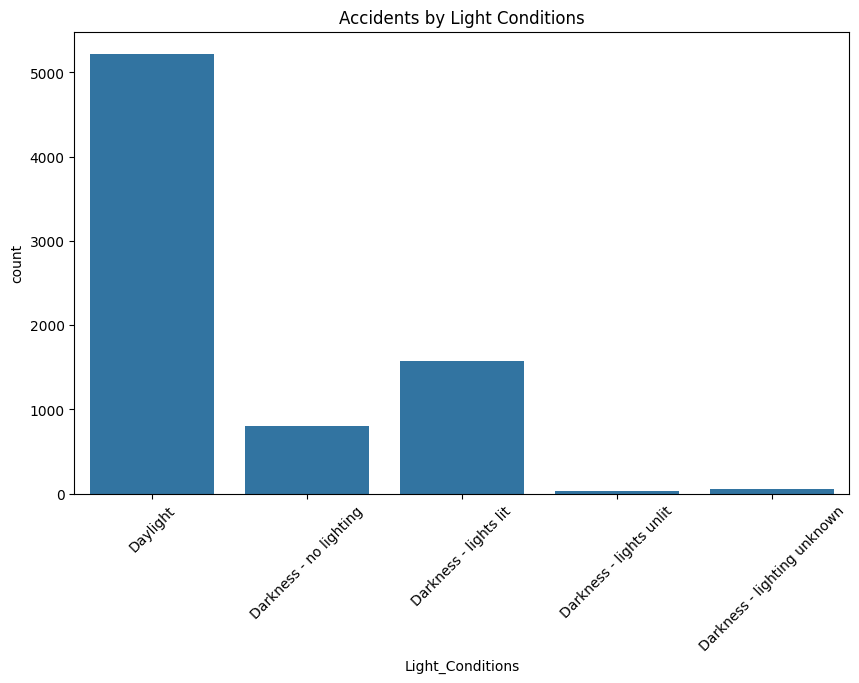

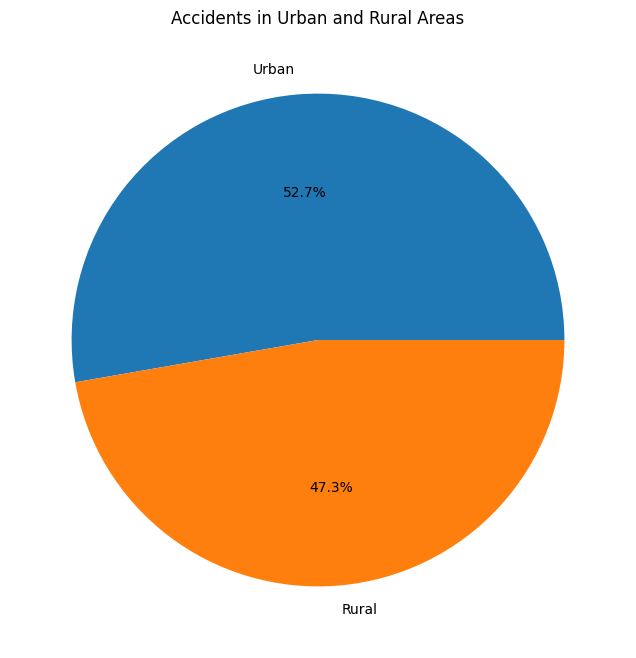

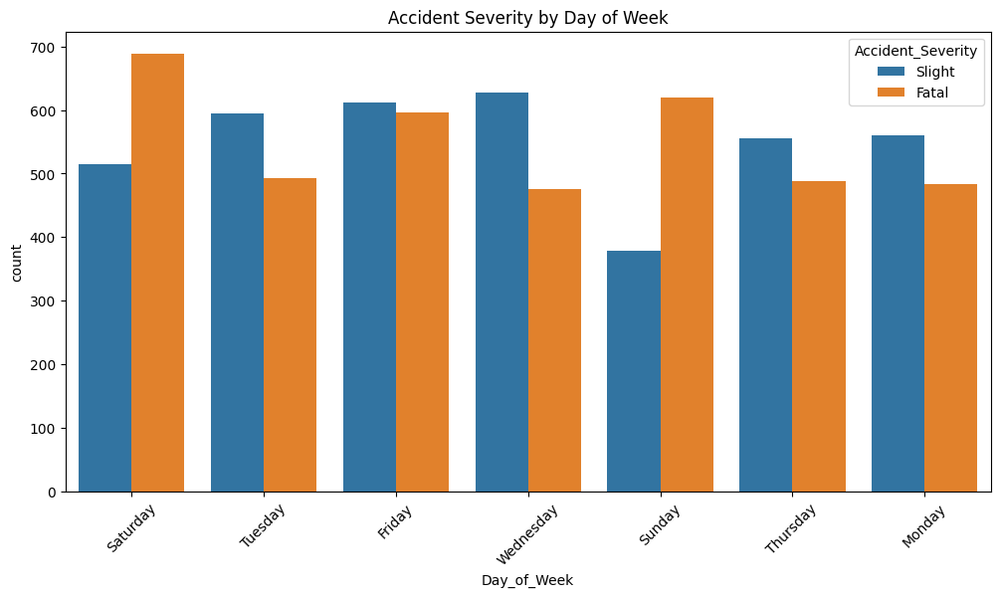

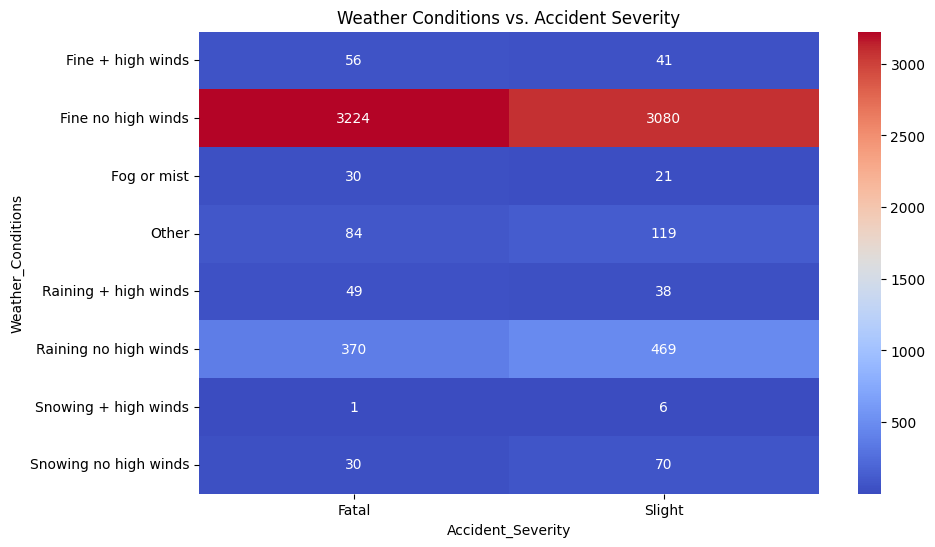

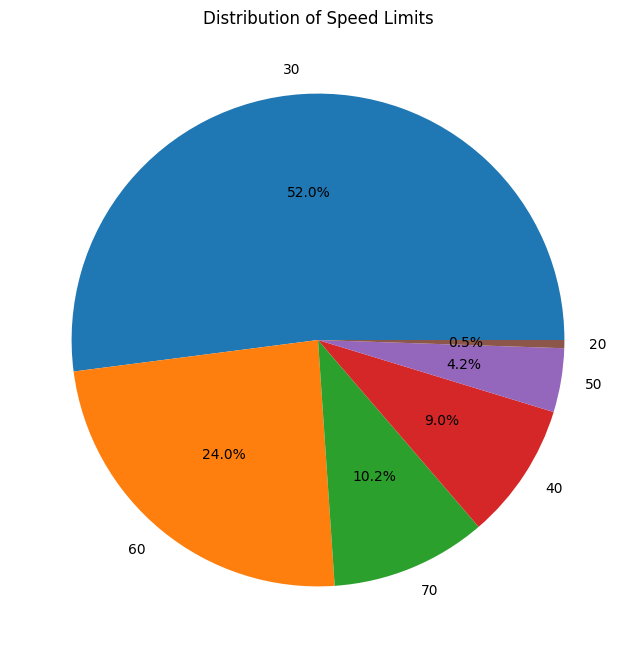

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Bar chart for Light Conditions
plt.figure(figsize=(10, 6))
sns.countplot(x='Light_Conditions', data=data)
plt.title('Accidents by Light Conditions')
plt.xticks(rotation=45)
plt.show()

# Pie chart for Urban_or_Rural_Area
plt.figure(figsize=(8, 8))
data['Urban_or_Rural_Area'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Accidents in Urban and Rural Areas')
plt.ylabel('')
plt.show()

# Stacked bar chart for Accident_Severity by Day_of_Week
plt.figure(figsize=(12, 6))
sns.countplot(x='Day_of_Week', hue='Accident_Severity', data=data)
plt.title('Accident Severity by Day of Week')
plt.xticks(rotation=45)
plt.show()

# Heatmap for Weather_Conditions and Accident_Severity
plt.figure(figsize=(10, 6))
weather_accident_pivot = data.pivot_table(index='Weather_Conditions', columns='Accident_Severity', aggfunc='size', fill_value=0)
sns.heatmap(weather_accident_pivot, annot=True, fmt='d', cmap='coolwarm')
plt.title('Weather Conditions vs. Accident Severity')
plt.show()

# Pie chart for Speed Limit
plt.figure(figsize=(8, 8))
data['Speed_limit'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Distribution of Speed Limits')
plt.ylabel('')
plt.show()

##Encoding the data

*Changing the data type in 'Time' column from continuous to discrete

In [7]:
for index, row in data.iterrows():
    data.at[index, 'Time'] = int(row['Time'].split(':')[0])
    if data.at[index, 'Time'] == 0:
      data.at[index, 'Time'] = 24
data['Time'] = data['Time'].astype(int)
print(data['Time'])

225222    15
211353    10
233646    16
303069    21
126383     6
          ..
95725      8
107217    19
175764    19
301030     3
273601    18
Name: Time, Length: 7688, dtype: int64


*change the name of 'Urban_or_Rural_Area' column to 'Is_Urban'

In [8]:
data.rename(columns={'Urban_or_Rural_Area': 'Is_Urban'}, inplace=True)

*Encoding 'Urban_or_Rural_Area' column

In [9]:
#urban=1, rural=0
from sklearn.preprocessing import LabelBinarizer

lb = LabelBinarizer()
data['Is_Urban'] = lb.fit_transform(data['Is_Urban'])
print(data['Is_Urban'])

225222    1
211353    0
233646    1
303069    0
126383    0
         ..
95725     0
107217    0
175764    1
301030    0
273601    0
Name: Is_Urban, Length: 7688, dtype: int64


*Encoding the target column 'Accident_Severity'

In [10]:
from sklearn.preprocessing import OrdinalEncoder

# Sample dataset
category = ['Slight', 'Fatal']

# Initialize OrdinalEncoder
encoder = OrdinalEncoder(categories=[category])

data_reshaped=data['Accident_Severity'].values.reshape(-1,1)

# Fit and transform the data
data['Accident_Severity'] = encoder.fit_transform(data_reshaped)

data['Accident_Severity'] = data['Accident_Severity'].astype(int)
# Display the encoded data
data.head()


,Day_of_Week,Junction_Control,Junction_Detail,Accident_Severity,Latitude,Light_Conditions,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Speed_limit,Time,Is_Urban,Weather_Conditions,Vehicle_Type
225222,Saturday,Give way or uncontrolled,T or staggered junction,0,52.449115,Daylight,-1.821632,1,2,Wet or damp,Single carriageway,30,15,1,Fine no high winds,Car
211353,Tuesday,Give way or uncontrolled,T or staggered junction,1,54.487235,Daylight,-1.191248,3,2,Dry,Single carriageway,60,10,0,Fine no high winds,Car
233646,Tuesday,Give way or uncontrolled,T or staggered junction,1,52.986152,Daylight,-2.115708,1,1,Wet or damp,Single carriageway,30,16,1,Fine no high winds,Car
303069,Friday,Data missing or out of range,Not at junction or within 20 metres,1,51.919042,Darkness - no lighting,-2.912664,1,1,Dry,Single carriageway,60,21,0,Fine no high winds,Motorcycle 50cc and under
126383,Friday,Stop sign,Crossroads,1,51.283235,Darkness - no lighting,0.065164,2,2,Wet or damp,Single carriageway,60,6,0,Raining no high winds,Car


In [11]:
# Select the object (string) columns
import numpy as np

mask = data.dtypes == object
categorical_cols = data.columns[mask]
categorical_cols

Index(['Day_of_Week', 'Junction_Control', 'Junction_Detail',
       'Light_Conditions', 'Road_Surface_Conditions', 'Road_Type',
       'Weather_Conditions', 'Vehicle_Type'],
      dtype='object')

In [94]:
for col in categorical_cols:
    unique_values = data[col].unique()
    num_unique_values = data[col].nunique()
    print(f"'{col}': {unique_values} = {num_unique_values}")

'Day_of_Week': ['Saturday' 'Tuesday' 'Friday' 'Wednesday' 'Sunday' 'Thursday' 'Monday'] = 7
'Junction_Control': ['Give way or uncontrolled' 'Data missing or out of range' 'Stop sign'
 'Not at junction or within 20 metres' 'Auto traffic signal'
 'Authorised person' 'Auto traffic sigl'] = 7
'Junction_Detail': ['T or staggered junction' 'Not at junction or within 20 metres'
 'Crossroads' 'Roundabout' 'Private drive or entrance' 'Slip road'
 'Other junction' 'Mini-roundabout' 'More than 4 arms (not roundabout)'] = 9
'Light_Conditions': ['Daylight' 'Darkness - no lighting' 'Darkness - lights lit'
 'Darkness - lights unlit' 'Darkness - lighting unknown'] = 5
'Road_Surface_Conditions': ['Wet or damp' 'Dry' 'Frost or ice' 'Flood over 3cm. deep' 'Snow'] = 5
'Road_Type': ['Single carriageway' 'Dual carriageway' 'One way street' 'Roundabout'
 'Slip road'] = 5
'Weather_Conditions': ['Fine no high winds' 'Raining no high winds' 'Fog or mist'
 'Fine + high winds' 'Other' 'Raining + high winds'
 'Sno

In [12]:
# Determine how many extra columns would be created
num_ohc_cols = (data[categorical_cols]
                .apply(lambda x: x.nunique())
                .sort_values(ascending=False))


# No need to encode if there is only one value
small_num_ohc_cols = num_ohc_cols.loc[num_ohc_cols>1]

# Number of one-hot columns is one less than the number of categories
small_num_ohc_cols -= 1

# This is 52 columns, assuming the original ones are dropped.
# This is quite a few extra columns!
small_num_ohc_cols.sum()

52

*choosing 'OneHotEncoder' over 'get_dummies' because 'OneHotEncoder' is more flexible and can handle a wider range of scenarios, such as working with missing values and unknown categories

In [13]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

# Copy of the data
data_ohc = data.copy()

# The encoders
le = LabelEncoder()
ohc = OneHotEncoder()

for col in num_ohc_cols.index:

    # Integer encode the string categories
    dat = le.fit_transform(data_ohc[col]).astype(int)

    # Remove the original column from the dataframe
    data_ohc = data_ohc.drop(col, axis=1)

    # One hot encode the data--this returns a sparse array
    new_dat = ohc.fit_transform(dat.reshape(-1,1))

    # Create unique column names
    n_cols = new_dat.shape[1]
    col_names = ['_'.join([col, str(x)]) for x in range(n_cols)]

    # Create the new dataframe
    new_df = pd.DataFrame(new_dat.toarray(),
                          index=data_ohc.index,
                          columns=col_names)

    # Append the new data to the dataframe
    data_ohc = pd.concat([data_ohc, new_df], axis=1)


In [97]:
data_ohc

,Accident_Severity,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles,Speed_limit,Time,Is_Urban,Vehicle_Type_0,Vehicle_Type_1,...,Road_Surface_Conditions_0,Road_Surface_Conditions_1,Road_Surface_Conditions_2,Road_Surface_Conditions_3,Road_Surface_Conditions_4,Road_Type_0,Road_Type_1,Road_Type_2,Road_Type_3,Road_Type_4
225222,0,52.449115,-1.821632,1,2,30,15,1,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
211353,1,54.487235,-1.191248,3,2,60,10,0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
233646,1,52.986152,-2.115708,1,1,30,16,1,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
303069,1,51.919042,-2.912664,1,1,60,21,0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
126383,1,51.283235,0.065164,2,2,60,6,0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95725,1,52.600959,1.221593,1,1,70,8,0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
107217,1,51.514859,-0.535904,3,3,40,19,0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
175764,0,51.383896,0.109073,1,2,30,19,1,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
301030,1,53.206008,-2.958191,1,1,60,3,0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [16]:
# Column difference is as calculated above
data_ohc.shape[1] - data.shape[1]

52

##checking correlation between dependent variables

In [17]:
# Calculate the correlation values
feature_cols = data_ohc.columns[:-1]
corr_values = data_ohc[feature_cols].corr()

# Simplify by emptying all the data below the diagonal
tril_index = np.tril_indices_from(corr_values)

# Make the unused values NaNs
for coord in zip(*tril_index):
    corr_values.iloc[coord[0], coord[1]] = np.NaN

# Stack the data and convert to a data frame
corr_values = (corr_values.stack().to_frame().reset_index().rename(columns={'level_0':'feature1','level_1':'feature2',0:'correlation'}))

# Get the absolute values for sorting
corr_values['abs_correlation'] = corr_values.correlation.abs()

*The histogram shows that the colums have low correlation. Most of them have zero correlation.

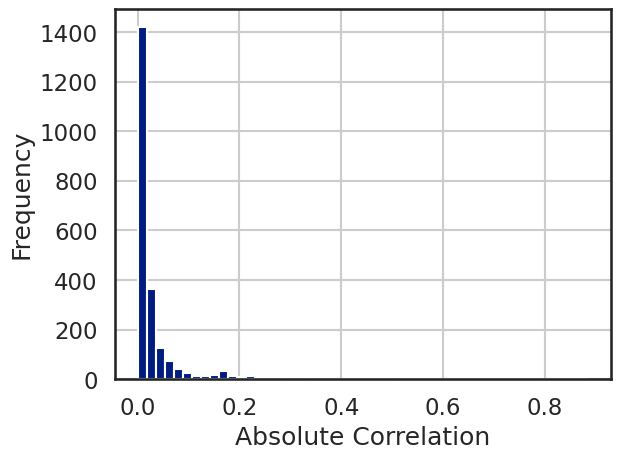

In [18]:
#A histogram of the absolute value correlations.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_context('talk')
sns.set_style('white')
sns.set_palette('dark')

ax = corr_values.abs_correlation.hist(bins=50)

ax.set(xlabel='Absolute Correlation', ylabel='Frequency');

##Checking Skew of the data

In [14]:
data= data_ohc
y_col = 'Accident_Severity'
feature_cols = [x for x in data.columns if x != y_col]
x_data = data[feature_cols]
y_data = data[y_col]

In [15]:
# Create a list of float and int columns (excluding the target) to check for skewing
mask = ((data.dtypes == float) | (data.dtypes == int)) & (data.columns != 'Accident_Severity')
numeric_cols = data.columns[mask]
skew_limit = 0.75
skew_vals = x_data[numeric_cols].skew()

skew_cols = (skew_vals
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {0}'.format(skew_limit)))


skew_cols

,Skew
Junction_Control_1,50.603026
Vehicle_Type_11,50.603026
Weather_Conditions_6,33.101574
Junction_Control_0,29.181427
Vehicle_Type_0,22.577294
Vehicle_Type_5,21.856086
Road_Surface_Conditions_1,21.856086
Light_Conditions_2,16.482751
Junction_Control_6,15.167853
Junction_Detail_1,12.281099


*Reducing skewness by applying transformations that make the distribution more symmetric- log transformation

In [16]:
# Mute the setting wtih a copy warnings
pd.options.mode.chained_assignment = None

for col in skew_cols.index.tolist():
    x_data[col] = np.log1p(x_data[col])

*Checking if the transformation is working, in this case the log transoformation isn't working

In [22]:
# Check the skewness again
skew_vals_after = x_data[numeric_cols].skew()
skew_cols_after = (skew_vals_after
                   .sort_values(ascending=False)
                   .to_frame()
                   .rename(columns={0: 'Skew'})
                   .query('abs(Skew) > {0}'.format(skew_limit)))

skew_cols_after

,Skew
Junction_Control_1,50.603026
Vehicle_Type_11,50.603026
Weather_Conditions_6,33.101574
Junction_Control_0,29.181427
Vehicle_Type_0,22.577294
Road_Surface_Conditions_1,21.856086
Vehicle_Type_5,21.856086
Light_Conditions_2,16.482751
Junction_Control_6,15.167853
Junction_Detail_1,12.281099


*Winsorization is a technique used in statistics to deal with outliers in a dataset.It involves setting the extreme values of a dataset to be equal to some specified percentile of the data.

In [17]:
# Winsorization (replace values above 95th percentile with 95th percentile value)
for col in skew_cols.index.tolist():
    percentile_95 = np.percentile(x_data[col], 95)
    x_data[col] = np.where(x_data[col] > percentile_95, percentile_95, x_data[col])

*Checking if Winsorization technique is working

In [24]:
# Check the skewness again
skew_vals_after = x_data[numeric_cols].skew()
skew_cols_after = (skew_vals_after
                   .sort_values(ascending=False)
                   .to_frame()
                   .rename(columns={0: 'Skew'})
                   .query('abs(Skew) > {0}'.format(skew_limit)))

skew_cols_after

,Skew
Junction_Detail_6,3.860414
Junction_Detail_0,2.945544
Junction_Control_2,2.865649
Junction_Control_5,2.584877
Light_Conditions_3,2.578084
Weather_Conditions_5,2.507637
Day_of_Week_3,2.203288
Day_of_Week_1,2.128326
Day_of_Week_4,2.128326
Day_of_Week_5,2.057347


In [18]:
from sklearn.preprocessing import RobustScaler

# Create RobustScaler object
scaler = RobustScaler()

# Apply RobustScaler to the skewed column
x_data[skew_cols.index.tolist()] = scaler.fit_transform(x_data[skew_cols.index.tolist()])

##Scaling the data

Using 'MinMaxScaler' when you need to bound the data to a specific range, especially if your data does not follow a normal distribution or if you are using algorithms that require the data to be on a similar scale, such as KNN.

In [19]:
# Mute the sklearn warning
import warnings
warnings.filterwarnings('ignore', module='sklearn')

from sklearn.preprocessing import MinMaxScaler

msc = MinMaxScaler()
x_data = pd.DataFrame(msc.fit_transform(x_data),  # this is an np.array, not a dataframe.
                    columns=x_data.columns)
x_data

,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles,Speed_limit,Time,Is_Urban,Vehicle_Type_0,Vehicle_Type_1,Vehicle_Type_2,...,Road_Surface_Conditions_0,Road_Surface_Conditions_1,Road_Surface_Conditions_2,Road_Surface_Conditions_3,Road_Surface_Conditions_4,Road_Type_0,Road_Type_1,Road_Type_2,Road_Type_3,Road_Type_4
0,0.487209,0.563440,0.000000,0.584963,0.2,0.608696,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.892835,0.640467,0.756471,0.584963,0.8,0.391304,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.595572,0.527506,0.000000,0.000000,0.2,0.652174,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.379179,0.430124,0.000000,0.000000,0.8,0.869565,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.248163,0.793991,0.442507,0.584963,0.8,0.217391,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7683,0.517958,0.935297,0.000000,0.000000,1.0,0.304348,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
7684,0.296076,0.720545,0.756471,1.000000,0.4,0.782609,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7685,0.269011,0.799356,0.000000,0.584963,0.2,0.782609,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7686,0.639623,0.424561,0.000000,0.000000,0.8,0.086957,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


##Split the data into train and test

In [20]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data,stratify=y_data, test_size=0.3)

In [21]:
x_train.shape,y_train.shape,x_test.shape,y_test.shape

((5381, 67), (5381,), (2307, 67), (2307,))

##KNN

In [36]:
# Function to calculate the % of values that were correctly predicted

def accuracy(real, predict):
    return sum(real == predict) / float(real.shape[0])

*In KNN, the class of a sample is determined by the majority class among its k nearest neighbors, where k is a hyperparameter.

In your results, we tested different values of k (from 1 to 5) and calculated the accuracy of the KNN model on test data.

In [30]:
from sklearn.neighbors import KNeighborsClassifier

results_dict={}
for k in range(1,6):
    knn = KNeighborsClassifier(n_neighbors=k)

    knn.fit(x_train, y_train)

    y_pred = knn.predict(x_test)

    # Calculate accuracy
    acc = accuracy(y_test, y_pred)

    # Store results in the dictionary
    results_dict[k] = acc

for k, result in results_dict.items():
    print(f'k={k}, Accuracy={result}')

k=1, Accuracy=0.6176853055916776
k=2, Accuracy=0.599479843953186
k=3, Accuracy=0.6246207195491981
k=4, Accuracy=0.6272214997832684
k=5, Accuracy=0.6480277416558301


##PCA

*PCA (Principal Component Analysis) is a dimensionality reduction technique commonly used in machine learning and data analysis. It aims to reduce the number of features (or dimensions) in a dataset while preserving as much variance as possible. This is achieved by transforming the original features into a new set of orthogonal (uncorrelated) features called principal components.

In [24]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def measure_error(y_true, y_pred, label):
    return pd.Series({'accuracy':accuracy_score(y_true, y_pred),
                      'precision': precision_score(y_true, y_pred),
                      'recall': recall_score(y_true, y_pred),
                      'f1': f1_score(y_true, y_pred)},
                      name=label)

In [24]:
from sklearn import decomposition
import matplotlib.pyplot as plt

pca = decomposition.PCA(n_components=3, whiten=True)
pca.fit(x_train)
test_2d = pca.fit_transform(x_test)

*This plot shows the data points from your test set projected onto a three-dimensional space after applying Principal Component Analysis (PCA) for dimensionality reduction. Each point in the plot represents a sample, and its position is determined by its values along the three principal components (PC1, PC2, PC3).

The colors of the points represent the class labels (y_test), allowing you to visually inspect how well the samples from different classes are separated in the reduced 3D space. This can help you understand the underlying structure of your data and how well it can be separated into distinct classes based on the features you have.

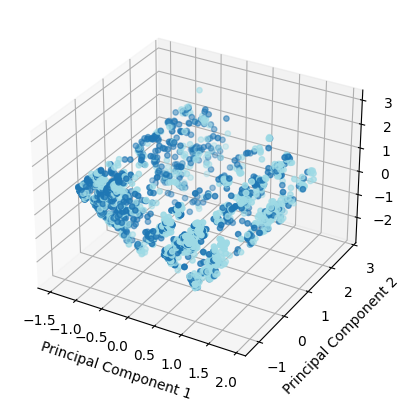

In [23]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(test_2d[:,0], test_2d[:,1], test_2d[:,2], s=15, c=y_test, cmap=plt.cm.tab20)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')

plt.show()


*We can see the samples from different classes are not separated.

In [33]:
X_train_pca = pca.transform(x_train)
X_test_pca = pca.transform(x_test)

*Trying logistic regression with PCA

In [35]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=0).fit(X_train_pca, y_train)
y_train_pred = clf.predict(X_train_pca)
y_test_pred = clf.predict(X_test_pca)
train_test_error = pd.concat([measure_error(y_train, y_train_pred, 'train'),
                                 measure_error(y_test, y_test_pred, 'test')],
                                axis=1)
train_test_error

,train,test
accuracy,0.615499,0.614651
precision,0.611171,0.609053
recall,0.634572,0.641248
f1,0.622652,0.624736


##LR- Logistic Regression

The LogisticRegressionCV class automatically performs k-fold cross-validation to select the best hyperparameters based on the provided values of Cs, penalty, and solver. It then fits the model on the entire dataset with the best hyperparameters found during cross-validation.

*Cs: This parameter controls the regularization strength, which helps prevent overfitting. It is a list of values to try for the inverse of regularization strength. Larger values mean less regularization.

*penalty: Specifies the norm used in the penalization. It can be 'l1' for L1 regularization, 'l2' for L2 regularization, or 'elasticnet' for a combination of both.L1 regularization is good for feature selection, L2 regularization is good for generalization, and Elastic Net combines both to provide a balance between the two.

*solver: This parameter specifies the algorithm to use in the optimization problem.

'saga': This is an extension of the SAG solver that also supports L1 regularization. It is recommended for large datasets and problems with a large number of features. It can handle both L1 and L2 penalties and is suitable for multi-class classification.

**L1 Regularization (Lasso):**

*L1 regularization adds a penalty term to the loss function that is proportional to the absolute value of the magnitude of the coefficients.

*It tends to produce sparse models, meaning it drives many coefficients to zero, effectively performing feature selection.

In [56]:
from sklearn.linear_model import LogisticRegressionCV

# L1 regularized logistic regression
lr_l1 = LogisticRegressionCV(Cs=10, cv=4, penalty='l1', solver='saga').fit(x_train, y_train)
y_test_pred_l1 = lr_l1.predict(x_test)
print("l1:", accuracy(y_test, y_test_pred_l1))

l1: 0.6900736887732987


In [57]:
print(lr_l1.Cs_)
best_C = lr_l1.C_[0]
print("Best C value:", best_C)

[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04]
Best C value: 2.782559402207126


**L2 Regularization (Ridge):**

*L2 regularization adds a penalty term to the loss function that is proportional to the square of the magnitude of the coefficients.

*It tends to shrink the coefficients towards zero but does not usually set them exactly to zero.

In [58]:
# L2 regularized logistic regression
lr_l2 = LogisticRegressionCV(Cs=10, cv=4, penalty='l2', solver='lbfgs').fit(x_train, y_train)
y_test_pred_l2 = lr_l2.predict(x_test)
print("l2:", accuracy(y_test, y_test_pred_l2))

l2: 0.6905071521456437


In [59]:
print(lr_l2.Cs_)
best_C = lr_l2.C_[0]
print("Best C value:", best_C)

[1.00000000e-04 7.74263683e-04 5.99484250e-03 4.64158883e-02
 3.59381366e-01 2.78255940e+00 2.15443469e+01 1.66810054e+02
 1.29154967e+03 1.00000000e+04]
Best C value: 2.782559402207126


In [60]:
from sklearn.linear_model import LogisticRegression
# Standard logistic regression- none regularization
lr_no_reg = LogisticRegression(C=100000).fit(x_train, y_train)
y_test_pred_lr_no_reg = lr_no_reg.predict(x_test)
print("lr_no_reg:", accuracy(y_test, y_test_pred_lr_no_reg))

lr_no_reg: 0.6913740788903338


*The maximum coefficient of each LR model

In [61]:
coeff_labels = ['l1', 'l2','lr_no_reg']
coeff_models = [lr_l1, lr_l2, lr_no_reg]
for lab,mod in zip(coeff_labels, coeff_models):
  print(lab, ":", np.max(np.abs(mod.coef_)))

l1 : 1.4482397461063155
l2 : 1.4407313545762255
lr_no_reg : 1.5995823054004685


*The sum of the coefficients for each LR model

In [62]:
coeff_labels = ['l1', 'l2','lr_no_reg']
coeff_models = [lr_l1, lr_l2, lr_no_reg]
for lab,mod in zip(coeff_labels, coeff_models):
  print(lab, ":", np.sum(np.abs(mod.coef_)))

l1 : 14.187626245662766
l2 : 14.450952088507984
lr_no_reg : 18.696072656501382


*Coefficients matrix for each LR model

In [66]:
coefficients = []

coeff_labels = ['l1', 'l2', 'lr_no_reg']
coeff_models = [lr_l1, lr_l2, lr_no_reg]

for label, model in zip(coeff_labels, coeff_models):
    coeffs = model.coef_
    if len(coeffs.shape) == 1:
        # Reshape 1D array to 2D array with one row
        coeffs = np.array([coeffs, -coeffs])
    else:
        # For multi-class classification, negate coefficients of one class
        coeffs = np.vstack((coeffs, -coeffs))
    for i in range(coeffs.shape[0]):
        coeff_label = pd.MultiIndex.from_tuples([(label, f'class_{i}')])
        coefficients.append(pd.DataFrame(coeffs[i], index=x_train.columns, columns=coeff_label))

coefficients_df = pd.concat(coefficients, axis=1)
coefficients_df.sample(10)


l1                  l2           lr_no_reg          
                     class_0   class_1   class_0   class_1   class_0   class_1
Day_of_Week_4      -0.023735  0.023735 -0.096465  0.096465 -0.498671  0.498671
Junction_Control_1  0.000000 -0.000000  0.000000 -0.000000  0.000000 -0.000000
Junction_Control_2  0.886338 -0.886338  0.935522 -0.935522  1.267495 -1.267495
Road_Type_1         0.000000 -0.000000  0.000000 -0.000000  0.000000 -0.000000
Latitude           -0.105740  0.105740 -0.108477  0.108477 -0.097871  0.097871
Road_Type_4         0.000000 -0.000000  0.000000 -0.000000  0.000000 -0.000000
Junction_Detail_3   0.150560 -0.150560  0.298457 -0.298457 -0.090555  0.090555
Junction_Control_4  0.617634 -0.617634  0.669229 -0.669229  0.999025 -0.999025
Junction_Detail_7   0.000000 -0.000000  0.000000 -0.000000  0.000000 -0.000000
Day_of_Week_1      -0.084301  0.084301 -0.156606  0.156606 -0.557509  0.557509

*According to the plot it seems that the three types of logistic regression have a lot of coefficients in common.

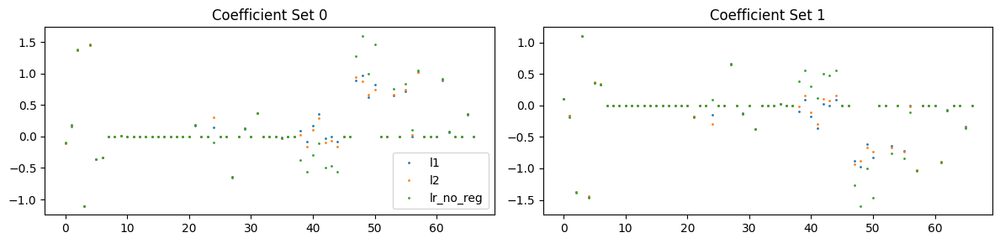

In [89]:
coefficients_combined = pd.concat(coefficients, axis=1)
coefficients_combined.columns = coefficients_combined.columns.droplevel(0)
coefficients_combined.reset_index(drop=True, inplace=True)

fig, axList = plt.subplots(nrows=1, ncols=2)
axList = axList.flatten()
fig.set_size_inches(12, 3)
for loc, ax in enumerate(axList):
    data_ = coefficients_combined.iloc[:, loc::2]
    data_.plot(marker='o', ls='', ms=1.0, ax=ax, legend=False)

    if ax is axList[0]:
        ax.legend(['l1', 'l2', 'lr_no_reg'], loc='best')  # Add legend based on column names

    ax.set(title='Coefficient Set ' + str(loc))

plt.tight_layout()


*Predict the class and the probability for each sample in the test

In [79]:
# Predict the class and the probability for each

y_pred = list()
y_prob = list()

coeff_labels = ['l1', 'l2','lr_no_reg']
coeff_models = [lr_l1, lr_l2, lr_no_reg]

for lab,mod in zip(coeff_labels, coeff_models):
    y_pred.append(pd.Series(mod.predict(x_test), name=lab))
    y_prob.append(pd.Series(mod.predict_proba(x_test).max(axis=1), name=lab))

y_pred = pd.concat(y_pred, axis=1)
y_prob = pd.concat(y_prob, axis=1)

y_pred.head()

,l1,l2,lr_no_reg
0,0,0,0
1,0,0,0
2,1,1,1
3,1,1,1
4,1,1,1


In [81]:
y_prob.head()

,l1,l2,lr_no_reg
0,0.529232,0.527999,0.526880
1,0.624621,0.627526,0.628188
2,0.589142,0.590110,0.590572
3,0.641464,0.643697,0.641401
4,0.510198,0.509050,0.510095


*Generally, the model with the highest F1-score or AUC (Area Under the Curve) is considered better, as these metrics balance precision and recall. In this case, the "lr_no_reg" model has the highest F1-score and AUC, so it is performing better in terms of overall prediction accuracy for the severity of car accidents.
However, the differences between the models are relatively small

In [76]:
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score
from sklearn.preprocessing import label_binarize

metrics = list()
cm = dict()

for lab in coeff_labels:

    # Preciision, recall, f-score from the multi-class support function
    precision, recall, fscore, _ = score(y_test, y_pred[lab], average='weighted')

    # The usual way to calculate accuracy
    accuracy = accuracy_score(y_test, y_pred[lab])

    # ROC-AUC scores can be calculated by binarizing the data
    auc = roc_auc_score(label_binarize(y_test, classes=[0,1]),
              label_binarize(y_pred[lab], classes=[0,1]),
              average='weighted')

    # Last, the confusion matrix
    cm[lab] = confusion_matrix(y_test, y_pred[lab])

    metrics.append(pd.Series({'precision':precision, 'recall':recall,
                              'fscore':fscore, 'accuracy':accuracy,
                              'auc':auc},
                             name=lab))

metrics = pd.concat(metrics, axis=1)

metrics

,l1,l2,lr_no_reg
precision,0.690104,0.690526,0.691387
recall,0.690074,0.690507,0.691374
fscore,0.690060,0.690498,0.691368
accuracy,0.690074,0.690507,0.691374
auc,0.690071,0.690505,0.691372


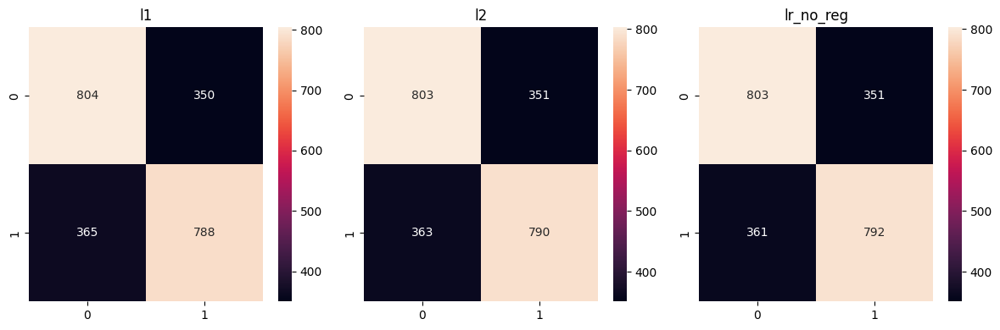

In [78]:
fig, axList = plt.subplots(nrows=1, ncols=3)
axList = axList.flatten()
fig.set_size_inches(12, 4)

#axList[-1].axis('off')

for ax,lab in zip(axList, coeff_labels):
    sns.heatmap(cm[lab], ax=ax, annot=True, fmt='d');
    ax.set(title=lab);

plt.tight_layout()

##Naive bayes

Naive Bayes is a classification algorithm based on Bayes' theorem, which assumes that features are conditionally independent given the class label.

There are several types of Naive Bayes classifiers, each with its own characteristics:

*Gaussian Naive Bayes: Assumes that continuous features follow a Gaussian distribution. It is suitable for continuous data.

*Multinomial Naive Bayes: Used for discrete features.

*Bernoulli Naive Bayes: Similar to Multinomial Naive Bayes but assumes that features are binary.

In [49]:
print(data.dtypes)

Accident_Severity         int64
Latitude                float64
Longitude               float64
Number_of_Casualties      int64
Number_of_Vehicles        int64
                         ...   
Road_Type_0             float64
Road_Type_1             float64
Road_Type_2             float64
Road_Type_3             float64
Road_Type_4             float64
Length: 68, dtype: object


*In general, GaussianNB model knows to deal with continuous data, MultinomialNB model knows to convert continuous data into discrete data.
BernoulliNB model doesn't do it in a good way.



In [50]:
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.model_selection import cross_val_score

nb = {'gaussian': GaussianNB(),
      'bernoulli': BernoulliNB(),
      'multinomial': MultinomialNB()}
scores = {}
cv_N = 4
for key, model in nb.items():
    s = cross_val_score(model, x_data, y_data, cv=cv_N, n_jobs=cv_N, scoring='accuracy')
    scores[key] = np.mean(s)
scores

{'gaussian': 0.6545265348595213,
 'bernoulli': 0.6389177939646202,
 'multinomial': 0.6352757544224765}

*GaussianNB performs the best among the three.

In [51]:
#Fit a GaussianNB to the training split.
model = GaussianNB()
model.fit(x_train, y_train)

#Get predictions on the test set.
predictions = model.predict(x_test)

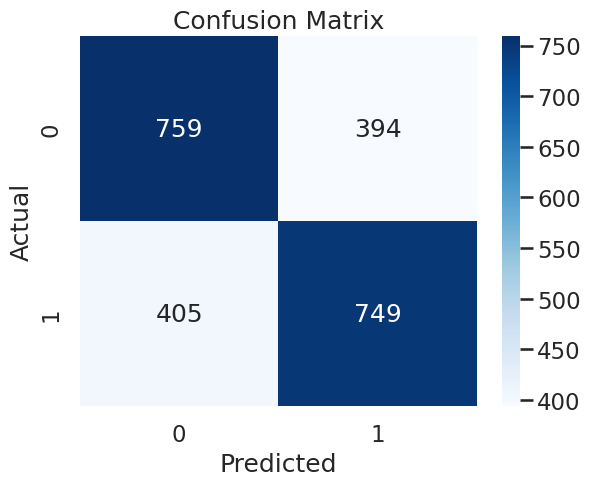

In [52]:
#use sns.heatmap to plot the confusion matrix for predictions.
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_test, predictions)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=model.classes_, yticklabels=model.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

*Discretizing the dataset and trying to perform MultinimialNB

In [53]:
# Create X_discrete from X using .rank(pct=True)
X_discrete = x_data.rank(pct=True)
X_discrete

,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles,Speed_limit,Time,Is_Urban,Vehicle_Type_0,Vehicle_Type_1,Vehicle_Type_2,...,Road_Surface_Conditions_0,Road_Surface_Conditions_1,Road_Surface_Conditions_2,Road_Surface_Conditions_3,Road_Surface_Conditions_4,Road_Type_0,Road_Type_1,Road_Type_2,Road_Type_3,Road_Type_4
0,0.536941,0.366415,0.339815,0.619147,0.265609,0.541103,0.736342,0.500065,0.500065,0.603993,...,0.164607,0.500065,0.500065,0.500065,0.861212,0.41012,0.500065,0.500065,0.62448,0.500065
1,0.908169,0.537721,0.906998,0.619147,0.777640,0.270421,0.236342,0.500065,0.500065,0.603993,...,0.664607,0.500065,0.500065,0.500065,0.361212,0.41012,0.500065,0.500065,0.62448,0.500065
2,0.662201,0.295005,0.339815,0.181907,0.265609,0.611993,0.736342,0.500065,0.500065,0.603993,...,0.164607,0.500065,0.500065,0.500065,0.861212,0.41012,0.500065,0.500065,0.62448,0.500065
3,0.447190,0.140609,0.339815,0.181907,0.777640,0.895096,0.236342,0.500065,0.500065,0.103993,...,0.664607,0.500065,0.500065,0.500065,0.361212,0.41012,0.500065,0.500065,0.62448,0.500065
4,0.129943,0.885276,0.774909,0.619147,0.777640,0.090010,0.236342,0.500065,0.500065,0.603993,...,0.164607,0.500065,0.500065,0.500065,0.861212,0.41012,0.500065,0.500065,0.62448,0.500065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7683,0.587019,0.983091,0.339815,0.181907,0.948946,0.174493,0.236342,0.500065,0.500065,0.603993,...,0.164607,0.500065,0.500065,0.500065,0.861212,0.91012,0.500065,0.500065,0.12448,0.500065
7684,0.266519,0.656868,0.906998,0.937305,0.570695,0.814581,0.236342,0.500065,0.500065,0.603993,...,0.664607,0.500065,0.500065,0.500065,0.361212,0.41012,0.500065,0.500065,0.62448,0.500065
7685,0.164412,0.893470,0.339815,0.619147,0.265609,0.814581,0.736342,0.500065,0.500065,0.603993,...,0.664607,0.500065,0.500065,0.500065,0.361212,0.41012,0.500065,0.500065,0.62448,0.500065
7686,0.696410,0.130983,0.339815,0.181907,0.777640,0.044875,0.236342,0.500065,0.500065,0.603993,...,0.664607,0.500065,0.500065,0.500065,0.361212,0.41012,0.500065,0.500065,0.62448,0.500065


In [54]:
# Modify X_discrete so that it is indeed discrete
X_discrete = X_discrete.applymap(lambda x: int(round(x * 100)))  # Convert percentile ranks to integers (rounded) and extract first 2 digits
X_discrete

,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles,Speed_limit,Time,Is_Urban,Vehicle_Type_0,Vehicle_Type_1,Vehicle_Type_2,...,Road_Surface_Conditions_0,Road_Surface_Conditions_1,Road_Surface_Conditions_2,Road_Surface_Conditions_3,Road_Surface_Conditions_4,Road_Type_0,Road_Type_1,Road_Type_2,Road_Type_3,Road_Type_4
0,54,37,34,62,27,54,74,50,50,60,...,16,50,50,50,86,41,50,50,62,50
1,91,54,91,62,78,27,24,50,50,60,...,66,50,50,50,36,41,50,50,62,50
2,66,30,34,18,27,61,74,50,50,60,...,16,50,50,50,86,41,50,50,62,50
3,45,14,34,18,78,90,24,50,50,10,...,66,50,50,50,36,41,50,50,62,50
4,13,89,77,62,78,9,24,50,50,60,...,16,50,50,50,86,41,50,50,62,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7683,59,98,34,18,95,17,24,50,50,60,...,16,50,50,50,86,91,50,50,12,50
7684,27,66,91,94,57,81,24,50,50,60,...,66,50,50,50,36,41,50,50,62,50
7685,16,89,34,62,27,81,74,50,50,60,...,66,50,50,50,36,41,50,50,62,50
7686,70,13,34,18,78,4,24,50,50,60,...,66,50,50,50,36,41,50,50,62,50


In [55]:
# Split X_discrete and y into training and test datasets
X_train_discrete, X_test_discrete, y_train_discrete, y_test_discrete = train_test_split(X_discrete, y_data, test_size=0.3, random_state=42)
# Fit a MultinomialNB to the training split
model_discrete = MultinomialNB()
model_discrete.fit(X_train_discrete, y_train_discrete)

# Get predictions on the test set
predictions_discrete = model_discrete.predict(X_test_discrete)

*The accurany is better than before

In [56]:
from sklearn.metrics import accuracy_score

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test_discrete, predictions_discrete)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.66


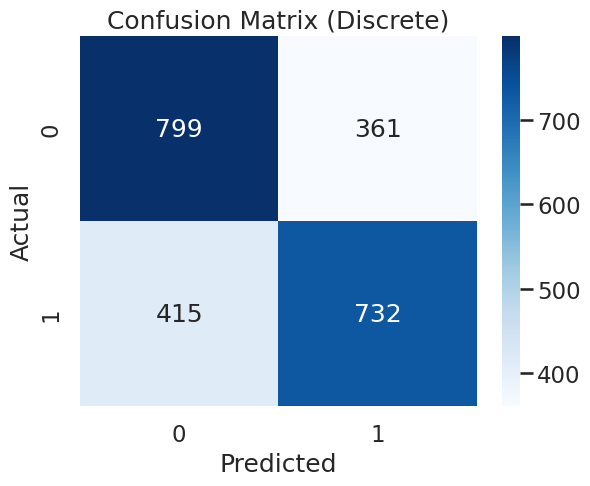

In [57]:
# Plot the confusion matrix for predictions
conf_matrix_discrete = confusion_matrix(y_test_discrete, predictions_discrete)
sns.heatmap(conf_matrix_discrete, annot=True, fmt='d', cmap="Blues", xticklabels=model_discrete.classes_, yticklabels=model_discrete.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Discrete)')
plt.show()

##SVM

*A higher degree allows the model to fit more complex datasets, potentially leading to overfitting. However, a lower degree might underfit the data. In this case, the grid search identified that a degree of 3 is the best choice.

*the C parameter is a regularization parameter that controls the trade-off between achieving a low error on the training data and minimizing the complexity of the decision boundary.


*   A small value of C emphasizes a simpler decision boundary, which may lead to
underfitting (the model is too simple to capture the underlying patterns in the data).
*   A large value of C emphasizes classifying the training data correctly, potentially leading to overfitting (the model is too complex and captures noise in the data).

In [111]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

param_grid = {
    'C': [0.1, 1, 100],
    'degree': [3, 5],
    'kernel': ['poly']
}
# Create the grid search object
grid_search = GridSearchCV(SVC(), param_grid, cv=4, scoring='accuracy', verbose=3, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(x_train, y_train)

# Print the best parameters
print("Best parameters:", grid_search.best_params_)

# Predict using the best model
y_pred = grid_search.predict(x_test)

# Print the classification report
print(classification_report(y_test, y_pred))

Fitting 4 folds for each of 6 candidates, totalling 24 fits
Best parameters: {'C': 1, 'degree': 3, 'kernel': 'poly'}
              precision    recall  f1-score   support

           0       0.69      0.73      0.71      1154
           1       0.71      0.67      0.69      1153

    accuracy                           0.70      2307
   macro avg       0.70      0.70      0.70      2307
weighted avg       0.70      0.70      0.70      2307



*Gamma is a parameter that determines the influence of a single training example.  

*   A small value of gamma means that points far away from the decision boundary are considered in calculating the decision boundary
*   A large value of gamma means that only points close to the decision boundary are considered.

In other words, a small gamma value makes the decision boundary smoother, potentially leading to underfitting, while a large gamma value makes the decision boundary more irregular, potentially leading to overfitting.

In [107]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Define parameters for cross-validation
param_grid = {'C': [0.1, 1, 10, 100],
              'gamma': [0.01, 0.1, 10]}

# Create SVM model
svm = SVC(kernel='rbf')

# Perform grid search with cross-validation
grid_search = GridSearchCV(svm, param_grid, cv=4, scoring='accuracy')
grid_search.fit(x_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

print("Best Parameters:", best_params)

# Predict using the best model
y_pred = grid_search.predict(x_test)

# Print the classification report
print(classification_report(y_test, y_pred))

Best Parameters: {'C': 1, 'gamma': 0.1}
              precision    recall  f1-score   support

           0       0.67      0.70      0.68      1153
           1       0.69      0.66      0.67      1154

    accuracy                           0.68      2307
   macro avg       0.68      0.68      0.68      2307
weighted avg       0.68      0.68      0.68      2307



*Based on these results, the SVM with RBF kernel performs slightly worse than the SVM with polynomial (poly) kernel in terms of F1-score and accuracy.

##Decision Tree

In [22]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=42)
dt = dt.fit(x_train, y_train)
print("node count: " ,dt.tree_.node_count,"max depth: ", dt.tree_.max_depth)

node count:  2613 max depth:  27


In [25]:
# The error on the training and test data sets
y_train_pred = dt.predict(x_train)
y_test_pred = dt.predict(x_test)

train_test_full_error = pd.concat([measure_error(y_train, y_train_pred, 'train'),
                              measure_error(y_test, y_test_pred, 'test')],
                              axis=1)

train_test_full_error

,train,test
accuracy,1.0,0.623754
precision,1.0,0.627803
recall,1.0,0.607112
f1,1.0,0.617284


*1.0 on the training set indicates that the model has perfectly fit the training data, but a low number on the test set suggests that the model's performance decreases on unseen data, indicating possible overfitting.

*These results indicate that while the decision tree model performs well on the training data, it may be overfitting and not generalizing well to unseen test data. Further tuning of the model or using techniques like pruning could help improve its performance on the test set.

In [62]:
from io import StringIO
from IPython.display import Image, display

from sklearn.tree import export_graphviz

try:
    import pydotplus
    pydotplus_installed = True

except:
    print('PyDotPlus must be installed to execute the remainder of the cells associated with this question.')
    print('Please see the instructions for this question for details.')
    pydotplus_installed = False
if pydotplus_installed:

    # Create an output destination for the file
    dot_data = StringIO()

    export_graphviz(dt, out_file=dot_data, filled=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    print(graph)
    # View the tree image
    filename = 'Car_Accidents_tree.png'
    graph.write_png(filename)
    img = Image(filename=filename)
    display(img)

else:
    print('This cell not executed because PyDotPlus could not be loaded.')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.552293 to fit



*This visualization helps to understand which features are most important for the decision tree model in making predictions

<Axes: >

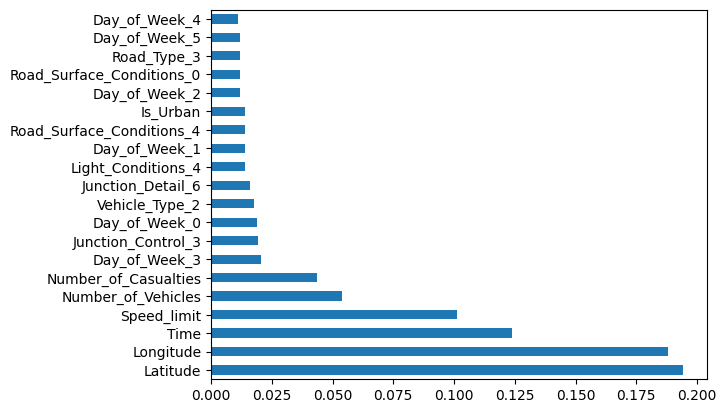

In [26]:
feature_imp = pd.Series(dt.feature_importances_, index=x_train.columns).sort_values(ascending=False)
feature_imp.nlargest(20).plot(kind='barh')

*Trying pruning the tree, but still there is overfitting

In [27]:
# Prune the decision tree using cost complexity pruning
path = dt.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

# Create a list of decision trees for each alpha
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(x_train, y_train)
    clfs.append(clf)

# Find the best alpha
test_scores = [clf.score(x_test, y_test) for clf in clfs]
best_alpha = ccp_alphas[np.argmax(test_scores)]

# Refit the tree with the best alpha
pruned_tree = DecisionTreeClassifier(random_state=42, ccp_alpha=best_alpha)
pruned_tree.fit(x_train, y_train)

print("After pruning - Depth:", pruned_tree.get_depth())

After pruning - Depth: 11


In [28]:
# Predictions for the pruned tree
y_train_pred_pruned = pruned_tree.predict(x_train)
y_test_pred_pruned = pruned_tree.predict(x_test)

train_test_full_error = pd.concat([measure_error(y_train, y_train_pred, 'train'),
                              measure_error(y_test, y_test_pred, 'test')],
                              axis=1)

train_test_full_error

,train,test
accuracy,1.0,0.623754
precision,1.0,0.627803
recall,1.0,0.607112
f1,1.0,0.617284


*The step size of 2 is used to limit the number of values tested and to ensure that only odd values are considered, which is common practice to prevent ties in binary splits in decision trees.

In [29]:
from sklearn.model_selection import GridSearchCV
param_grid = {'max_depth':range(1, dt.tree_.max_depth+1, 2),
              'max_features': range(1, len(dt.feature_importances_)+1)}

GR = GridSearchCV(DecisionTreeClassifier(random_state=42),
                  param_grid=param_grid,
                  scoring='accuracy',
                  n_jobs=-1)

GR = GR.fit(x_train, y_train)
print("node count: " ,GR.best_estimator_.tree_.node_count,"max depth: ",  GR.best_estimator_.tree_.max_depth)

node count:  211 max depth:  7


In [31]:
y_train_pred = GR.predict(x_train)
y_test_pred = GR.predict(x_test)

train_test_error = pd.concat([measure_error(y_train, y_train_pred, 'train'),
                                 measure_error(y_test, y_test_pred, 'test')],
                                axis=1)
train_test_error

,train,test
accuracy,0.736852,0.698743
precision,0.748926,0.699477
recall,0.712746,0.696444
f1,0.730388,0.697957


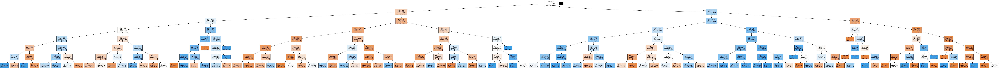

In [66]:
from io import StringIO
from IPython.display import Image, display

from sklearn.tree import export_graphviz
try:
    import pydotplus
    pydotplus_installed = True

except:
    print('PyDotPlus must be installed to execute the remainder of the cells associated with this question.')
    print('Please see the instructions for this question for details.')
    pydotplus_installed = False
if pydotplus_installed:

    # Create an output destination for the file
    dot_data = StringIO()

    export_graphviz(GR.best_estimator_, out_file=dot_data, filled=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

    # View the tree image
    filename = 'Car_Accidents_tree_prune.png'
    graph.write_png(filename)
    img = Image(filename=filename)
    display(img)

else:
    print('This cell not executed because PyDotPlus could not be loaded.')

*Speed limit feature is most important for the decision tree model in making predictions

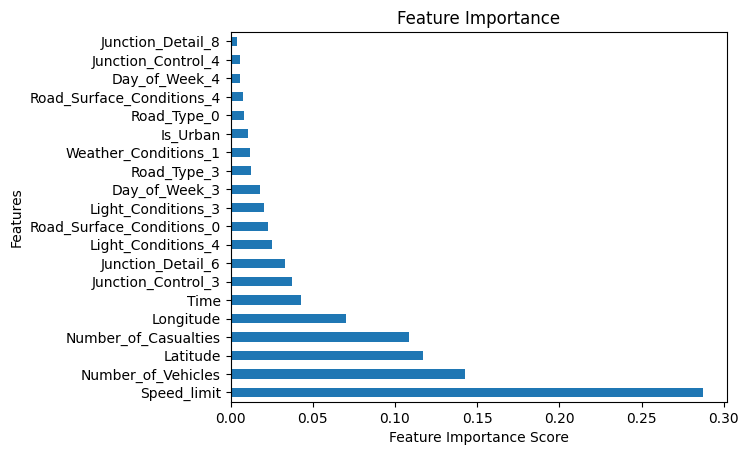

In [33]:
import matplotlib.pyplot as plt
# Get the feature importances of the best estimator from the grid search
feature_imp = pd.Series(GR.best_estimator_.feature_importances_, index=x_train.columns).sort_values(ascending=False)

# Plot the top 20 features
feature_imp.nlargest(20).plot(kind='barh')
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Feature Importance")
plt.show()


##Perceptorn

*The perceptron is a simple linear classifier used for binary classification tasks. It's one of the early neural network models and forms the basis for more complex neural network architectures. The perceptron learns by updating its weights based on misclassifications until it converges on a solution.

In [67]:
from sklearn.linear_model import Perceptron
from sklearn.metrics import cohen_kappa_score

clf = Perceptron(max_iter=100)
clf.fit(x_train, y_train)

accuracy = clf.score(x_test , y_test)
print( 'Accuracy is ', accuracy)
y_pred = clf.predict(x_test)
kappa = cohen_kappa_score(y_pred, y_test)
print('Choen_kappa_score', kappa)

Accuracy is  0.6571304724750758
Choen_kappa_score 0.3142693196981613


*Cohen's Kappa is a statistic that measures the level of agreement between two raters (or in this case, between the predicted and actual classes). It considers how much better the classifier is performing over what would be expected by chance. The score ranges from -1 (complete disagreement) to 1 (complete agreement), with 0 indicating agreement equivalent to random chance. In this case, the Cohen's Kappa score is approximately 0.314, indicating a moderate level of agreement beyond chance.

##Random Forest

How Random Forest algorithm works:

*Bootstrapping: Randomly select a subset of the training data (with replacement) to train each decision tree.

*Feature Randomness: At each node of the decision tree, only consider a random subset of features to make the best split. This helps to decorrelate the trees.

*Voting: For classification, each tree in the forest predicts the class, and the class with the most votes is the final prediction. For regression, the predictions of all trees are averaged to obtain the final prediction.

**OOB Error (Out-of-Bag Error)**: This is the error rate of the model on the training dataset, as estimated by using only the samples not included in the bootstrap sample (out-of-bag samples) to evaluate each individual tree. It provides an estimate of how well the model will generalize to new, unseen data. Lower OOB error indicates better generalization performance.

In [68]:
from sklearn.ensemble import RandomForestClassifier

# Initialize empty lists to store OOB error and test set accuracy
oob_list = []
accuracy_list = []
RF = RandomForestClassifier(oob_score=True,
                            random_state=42,
                            warm_start=True,
                            n_jobs=-1)


# Iterate through all of the possibilities for number of trees
for n_trees in [15, 20, 30, 40, 50, 100, 150, 200, 300, 400]:
    # Use this to set the number of trees
    RF.set_params(n_estimators=n_trees)

    # Fit the model
    RF.fit(x_train, y_train)

    # Get the OOB error
    oob_error = 1 - RF.oob_score_

    # Store the OOB error
    oob_list.append(pd.Series({'n_trees': n_trees, 'oob': oob_error}))

    # Get the accuracy on the test set
    accuracy = RF.score(x_test, y_test)

    # Store the accuracy
    accuracy_list.append(pd.Series({'n_trees': n_trees, 'accuracy': accuracy}))

# Create DataFrames from the lists
rf_oob_df = pd.concat(oob_list, axis=1).T.set_index('n_trees')
rf_accuracy_df = pd.concat(accuracy_list, axis=1).T.set_index('n_trees')

# Print the DataFrames
print("OOB Error:")
print(rf_oob_df)
print("\nTest Set Accuracy:")
print(rf_accuracy_df)

OOB Error:
              oob
n_trees          
15.0     0.352908
20.0     0.345661
30.0     0.330794
40.0     0.326891
50.0     0.320572
100.0    0.314068
150.0    0.314626
200.0    0.315555
300.0    0.312395
400.0    0.311466

Test Set Accuracy:
         accuracy
n_trees          
15.0     0.687906
20.0     0.689207
30.0     0.700910
40.0     0.697009
50.0     0.701344
100.0    0.703945
150.0    0.706545
200.0    0.708279
300.0    0.710013
400.0    0.713047


*About 100 is the point where further increases do not significantly improve performance as we can see in the plot

[Text(0, 0.5, 'oob error')]

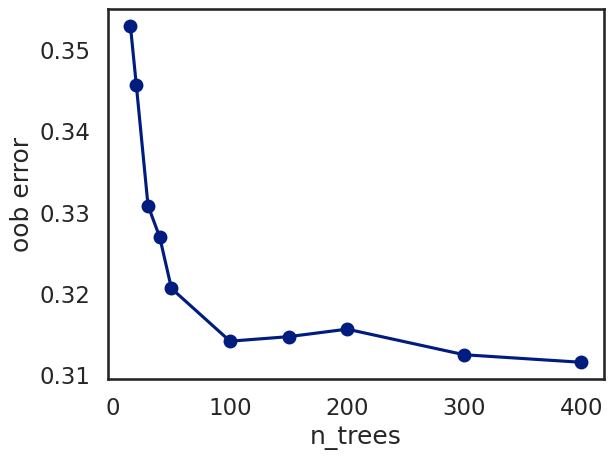

In [69]:
rf_oob_df = pd.concat(oob_list, axis=1).T.set_index('n_trees')

sns.set_context('talk')
sns.set_palette('dark')
sns.set_style('white')

ax = rf_oob_df.plot(legend=False, marker='o')
ax.set(ylabel='oob error')


How Extra Trees works:

*Bootstrapping: Like in Random Forest.

*Random Feature Selection: At each node of each decision tree, instead of considering all features to find the best split, Extra Trees randomly selects a subset of features. This random feature selection reduces the variance of the model and can lead to better generalization.

*Random Splits: In addition to randomly selecting features, Extra Trees also selects random thresholds for each feature to make the splits. Unlike in Random Forest, where the best split is chosen based on a criterion like Gini impurity or information gain, Extra Trees makes splits randomly without searching for the best one.

*Voting: Like in Random Forest.

->Extra Trees introduces more randomness in the tree-building process compared to Random Forest, which can help reduce overfitting and improve generalization performance. However, this increased randomness can also make Extra Trees more computationally expensive, as it requires training more trees and evaluating more random splits.

In [70]:
from sklearn.ensemble import ExtraTreesClassifier

# Initialize the random forest estimator
# Note that the number of trees is not setup here
EF = ExtraTreesClassifier(oob_score=True,
                          random_state=42,
                          warm_start=True,
                          bootstrap=True,
                          n_jobs=-1)

oob_list = list()
accuracy_list = []


# Iterate through all of the possibilities for
# number of trees
for n_trees in [15, 20, 30, 40, 50, 100, 150, 200, 300, 400]:

    # Use this to set the number of trees
    EF.set_params(n_estimators=n_trees)
    EF.fit(x_train, y_train)

    # oob error
    oob_error = 1 - EF.oob_score_
    oob_list.append(pd.Series({'n_trees': n_trees, 'oob': oob_error}))

    # Get the accuracy on the test set
    accuracy = EF.score(x_test, y_test)

    # Store the accuracy
    accuracy_list.append(pd.Series({'n_trees': n_trees, 'accuracy': accuracy}))

et_oob_df = pd.concat(oob_list, axis=1).T.set_index('n_trees')

# Create DataFrames from the lists
et_accuracy_df = pd.concat(accuracy_list, axis=1).T.set_index('n_trees')

# Print the DataFrames
print("OOB Error:")
print(et_oob_df)
print("\nTest Set Accuracy:")
print(et_accuracy_df)

OOB Error:
              oob
n_trees          
15.0     0.370935
20.0     0.358112
30.0     0.354395
40.0     0.341201
50.0     0.337670
100.0    0.332280
150.0    0.331909
200.0    0.329493
300.0    0.324289
400.0    0.323917

Test Set Accuracy:
         accuracy
n_trees          
15.0     0.662765
20.0     0.670134
30.0     0.670568
40.0     0.676203
50.0     0.681838
100.0    0.689640
150.0    0.688340
200.0    0.690074
300.0    0.690507
400.0    0.690941


*Random Forest is better than Extra Trees

In [71]:
oob_df = pd.concat([rf_oob_df.rename(columns={'oob':'RandomForest'}),
                    et_oob_df.rename(columns={'oob':'ExtraTrees'})], axis=1)

oob_df

,RandomForest,ExtraTrees
n_trees,,
15.0,0.352908,0.370935
20.0,0.345661,0.358112
30.0,0.330794,0.354395
40.0,0.326891,0.341201
50.0,0.320572,0.337670
100.0,0.314068,0.332280
150.0,0.314626,0.331909
200.0,0.315555,0.329493
300.0,0.312395,0.324289


*About 100 is the point where further increases do not significantly improve performance as we can see in the plot for the both algorithms.

*Random Forest is better than Extra Trees

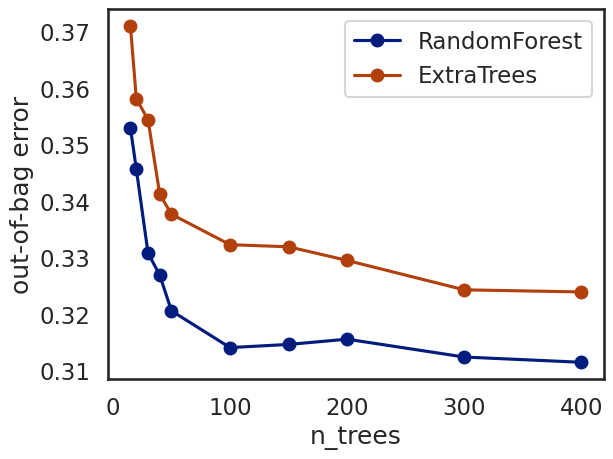

In [72]:
sns.set_context('talk')
sns.set_palette('dark')
sns.set_style('white')

ax = oob_df.plot(marker='o')
ax.set(ylabel='out-of-bag error');

##Summary

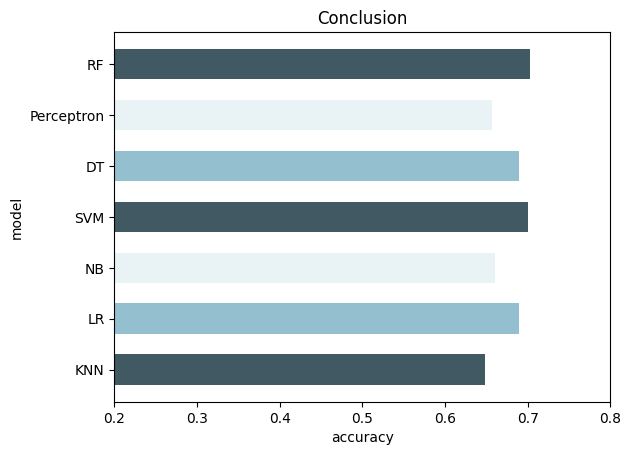

In [34]:
# y-coordinates of bottom sides of bars
bottom = [1, 2, 3, 4, 5, 6, 7]

# widths of bars
width = [0.648, 0.69, 0.66, 0.7, 0.69, 0.657, 0.703]

# labels for bars
tick_label = ['KNN', 'LR', 'NB', 'SVM', 'DT', 'Perceptron', 'RF']

# plotting a horizontal bar chart
plt.barh(bottom, width, tick_label=tick_label,
         height=0.6, color=['#405962', '#93bfce', '#e9f2f5'])
plt.xlim(xmax=0.8, xmin=0.2)
# naming the y-axis
plt.ylabel('model')
# naming the x-axis
plt.xlabel('accuracy')
# plot title
plt.title('Conclusion')

# function to show the plot
plt.show()